In [46]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.tri as tri
from matplotlib import cm, colors
from matplotlib.tri import Triangulation, TriAnalyzer, UniformTriRefiner
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.dates import DateFormatter
#from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cbook
from matplotlib.colors import LightSource
from matplotlib.markers import MarkerStyle
import matplotlib.patches as patches

from scipy import stats
from scipy import interpolate
from scipy.interpolate import griddata, interp1d
from scipy.interpolate import make_interp_spline, BSpline
from scipy.interpolate import interp1d
from scipy.interpolate import LinearNDInterpolator

import shapely
from shapely.geometry import Point, LineString
#from shapely.ops import nearest_points

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.offline
import plotly.express as px

import rasterio
from rasterio.transform import rowcol

import pyproj
from pyproj import Transformer
from pyproj import Geod

import metpy
from metpy import calc
from metpy.units import units

import geopandas as gpd
import os
import glob
import time
import requests
import ast
from datetime import datetime, timedelta
#import datetime
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D
from windrose import WindroseAxes
import seaborn as sns
from pathlib import Path
from PIL import Image
#import cufflinks as cf
import cartopy.crs as ccrs
#import cartopy.io.img_tiles as cimgt
#import pygmt
import dask

In [1]:
%run 'loadData.py'

/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:88: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  FF['date'] = pd.to_datetime(FF['Date'])
/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:115: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, 

correcting wind direction


/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:229: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  BH['date'][i] = pd.to_datetime(BH['date'][i],format="%d/%m/%Y/%H")
/home/kfha/OneDrive/ALT/J

data/UAV/iMet/20230913-141957-00065717_paraglider.csv
data/UAV/iMet/20230913-202940-00061169_front.csv
data/UAV/iMet/LATER_20231018-092721-00065717_glacier.csv
data/UAV/iMet/20230914-193303-00061169_inlet.csv
data/UAV/iMet/20230912-211512-00061169_glacier.csv
data/UAV/iMet/20230912-141957-00065717_front.csv
data/UAV/iMet/20230912-213501-00061143_inlet.csv
data/UAV/iMet/20230912-212134-00065805_outlet.csv
data/UAV/iMet/20230913-203721-00061143_inlet.csv
data/UAV/iMet/20230913-211517-00065808_outlet.csv
data/UAV/iMet/20230913-202034-00065805_glacier.csv
data/UAV/iMet/20230914-181348-00065805_glacier.csv
data/UAV/iMet/20230914-183917-00061143_front.csv


In [2]:
#%run 'plotData.py'
with open('plotData.py') as f:
    exec(f.read())

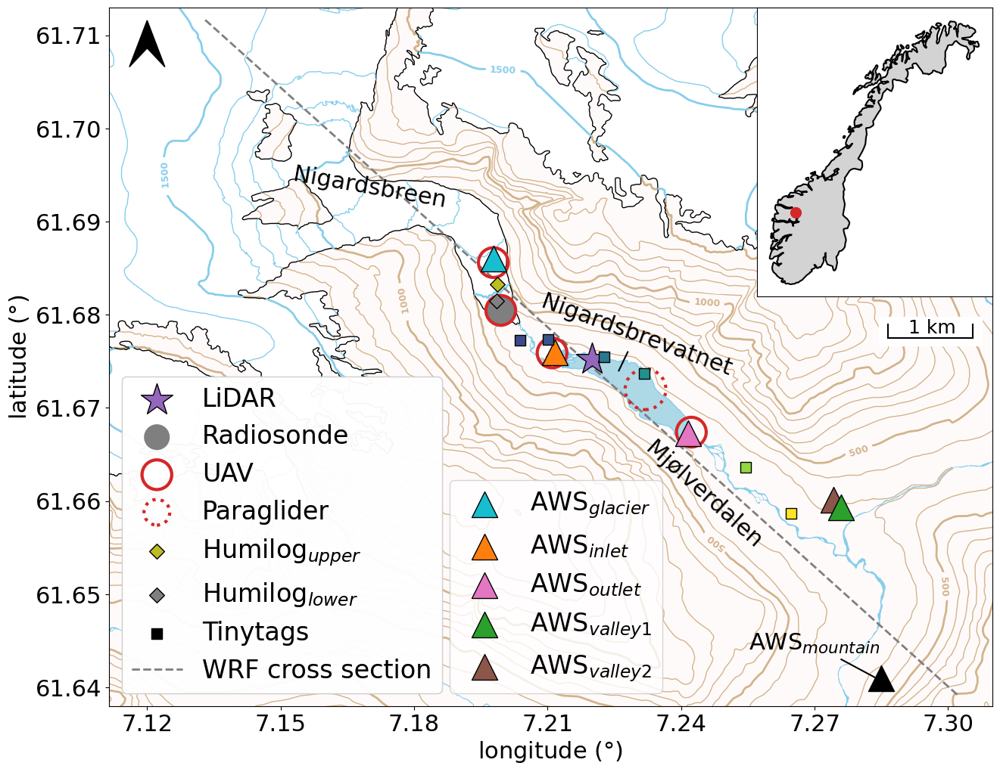

In [13]:
plotMap()

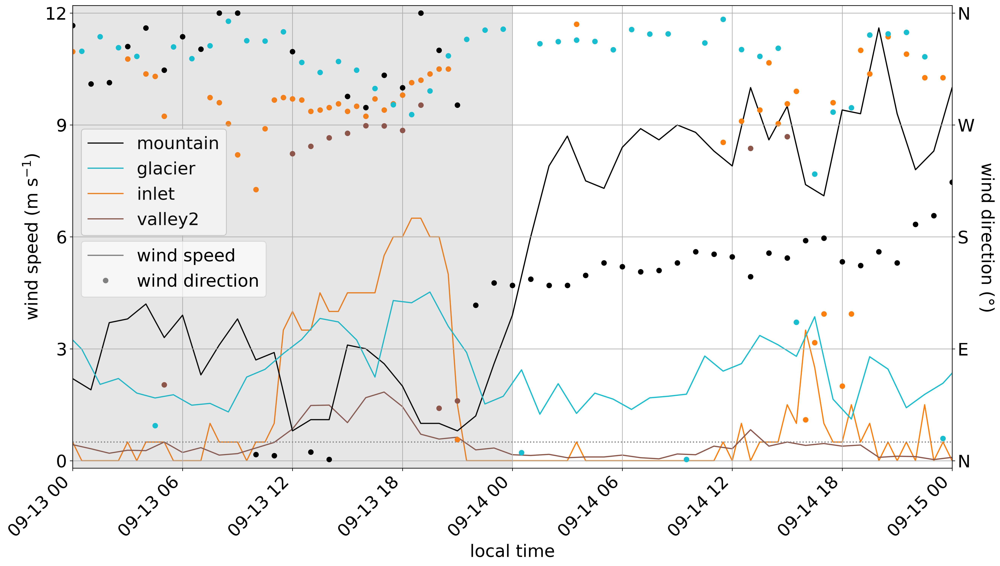

In [19]:
plotWindEvolution()

<string>:560: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


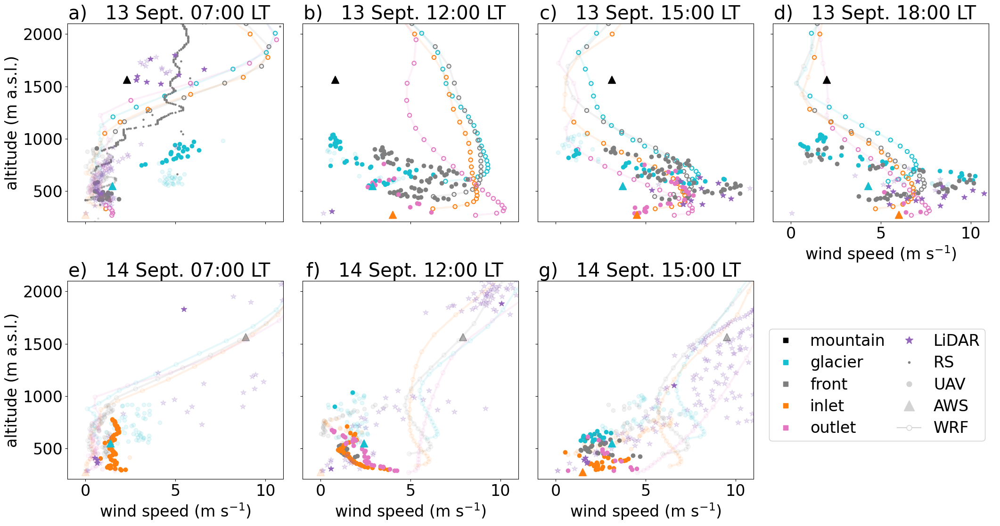

In [23]:
plotVerticalWindProfiles()

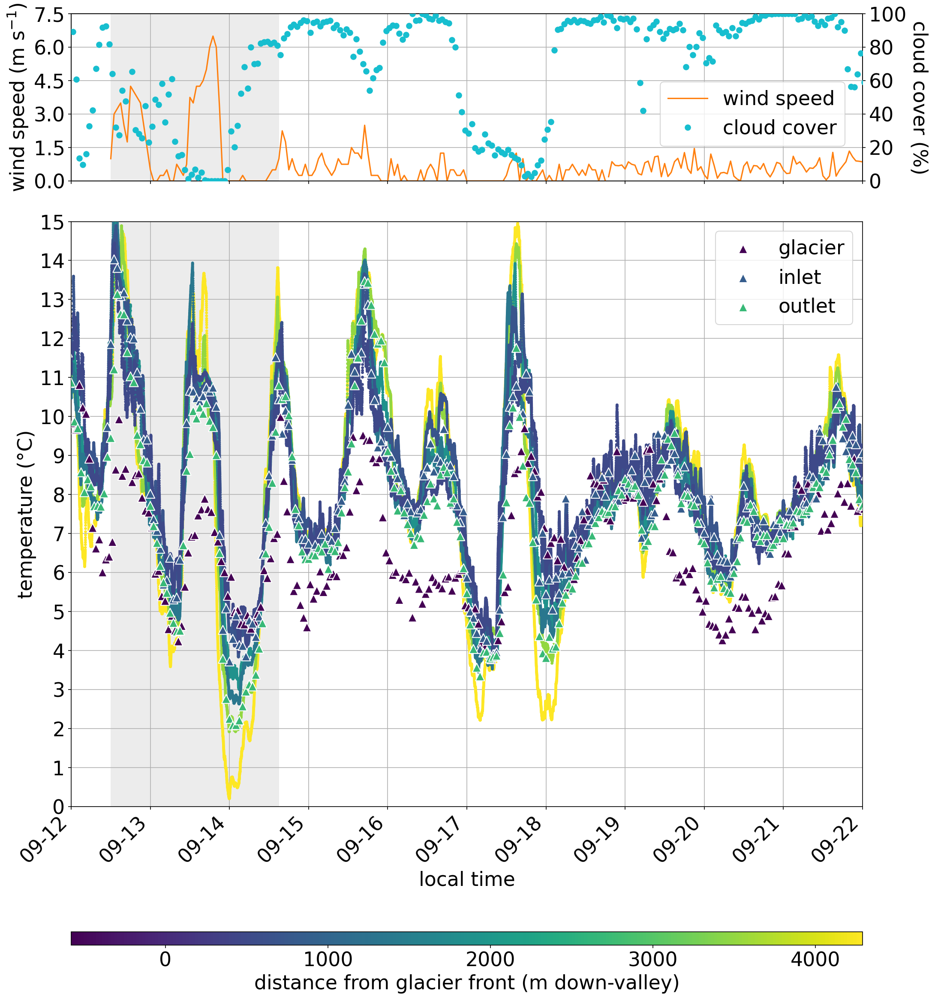

In [21]:
plotColdAirPools()

14-5-US-inlet.csv
14-5-US-glacier.cs
adding outlet
using already stored intalts
using already stored intalts_extended


<string>:1403: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

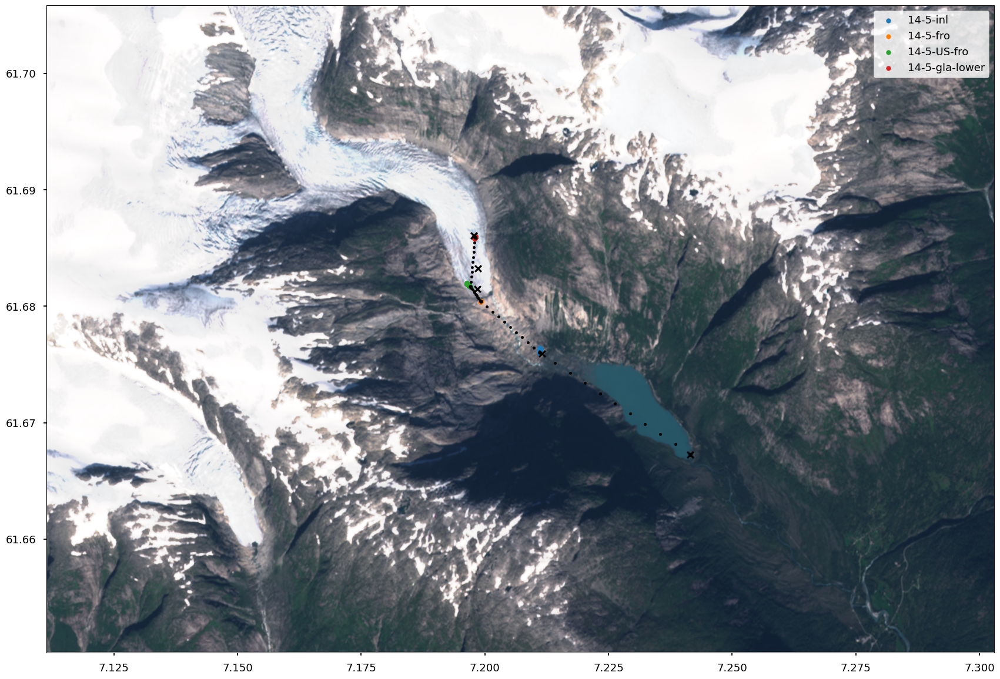

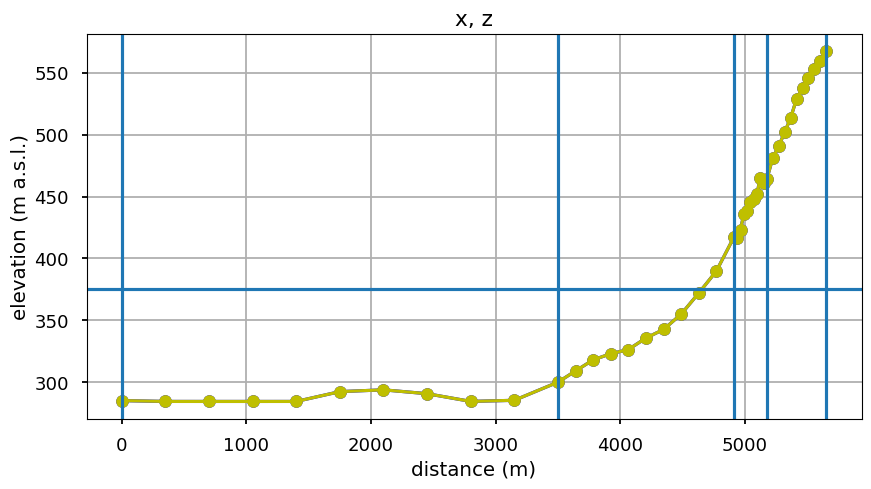

let us add something
adding outlet observation
pt
shifting profile nr 0 up 9.067380000000014 meters
shifting profile nr 4 up 8.333533333333321 meters
0 1
22 478
12 475
215 428
0 355
3499.215378662387


<string>:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1544: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1544: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

pt
plotting lake line
plotting glacier line
t
shifting profile nr 0 up 9.067380000000014 meters
shifting profile nr 4 up 8.333533333333321 meters
0 1
22 478
12 475
215 428
0 355
3499.215378662387
adding inlet near-surface observation and interpolating linearly up to start of vertical profile


<string>:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1544: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<string>:1544: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

t
285.06738 285.06738 282.32382
567.3912 567.3912 0.0
plotting lake line
plotting glacier line


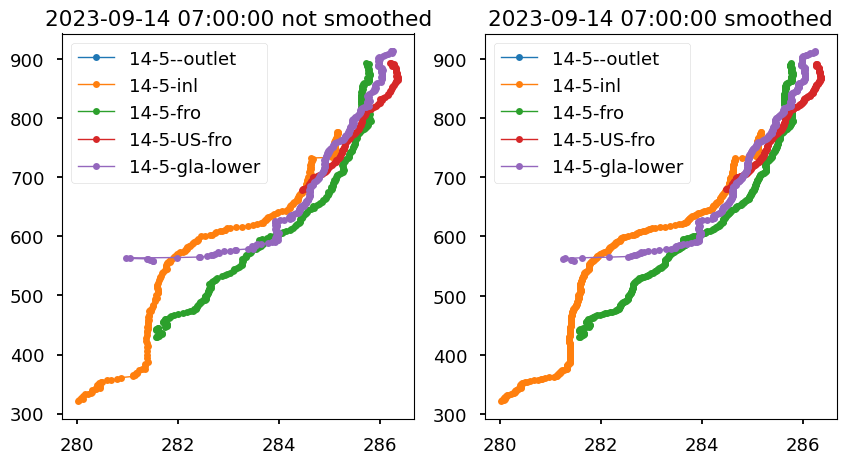

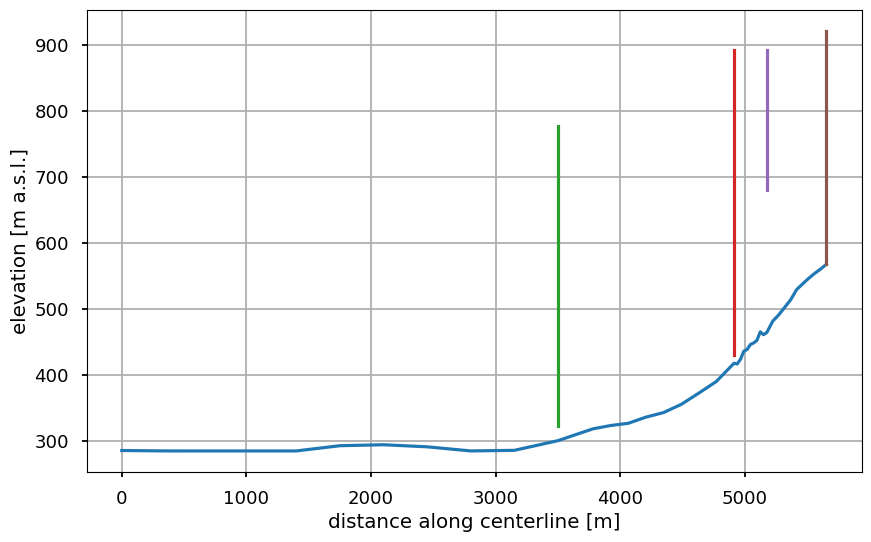

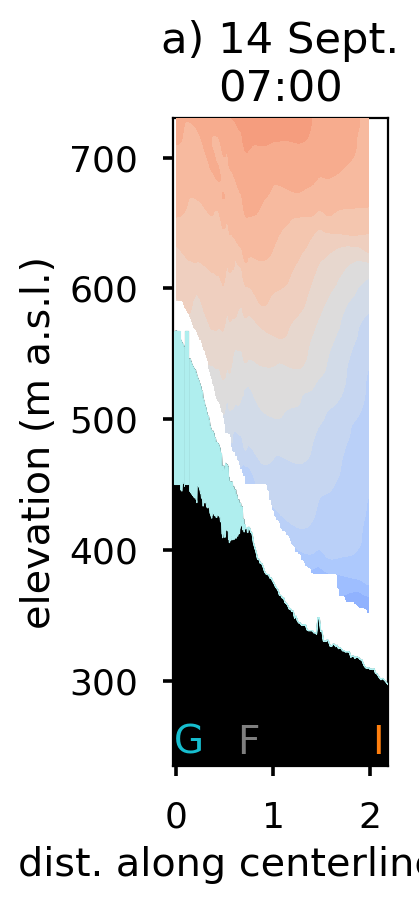

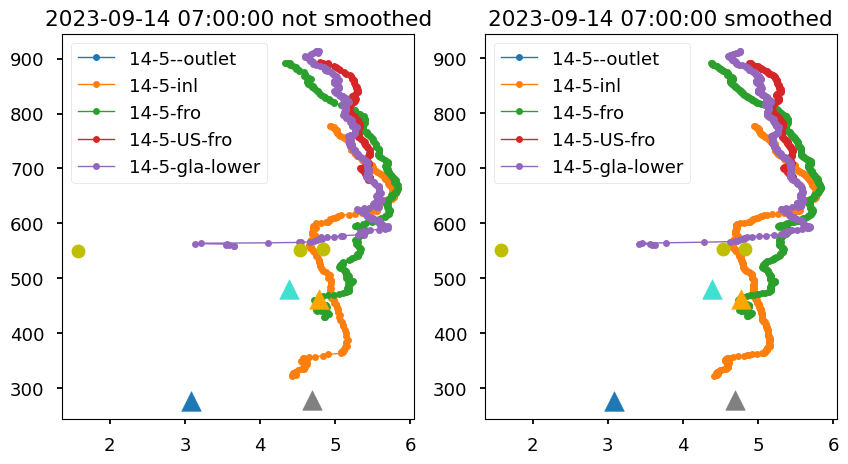

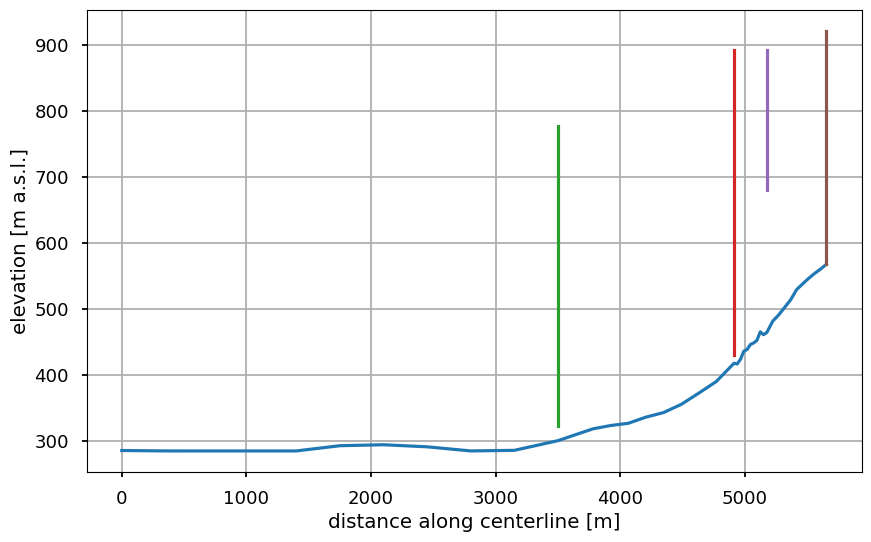

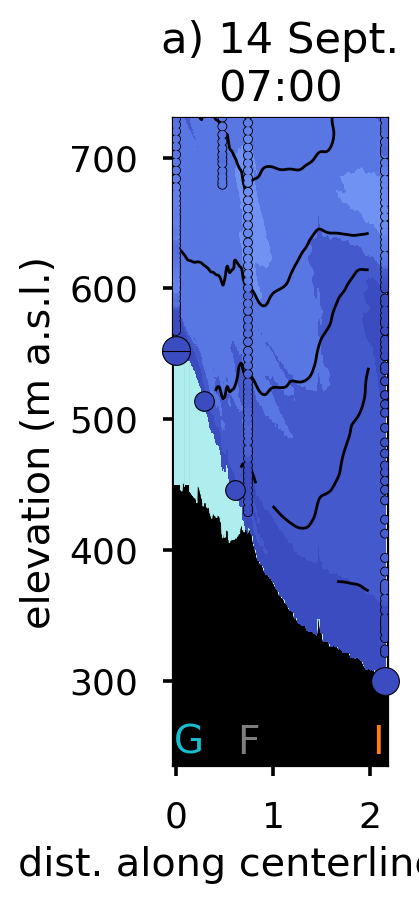

In [156]:
t, imets, intdist, intpts, intalts, intalts_extended, date = interpolateUAV_p1(ind1=0, ind2=2, day='14')
pt_contours = interpolateUAV_p2(var='pt', date=date)
interpolateUAV_p2(var='t', date=date, pt_contours=pt_contours)

MG 61.659 7.276 valley
NB 61.687 7.197 glacier
FF 61.67595235467888 7.211611010507808 inlet
NV 61.6672661 7.2415509 outlet


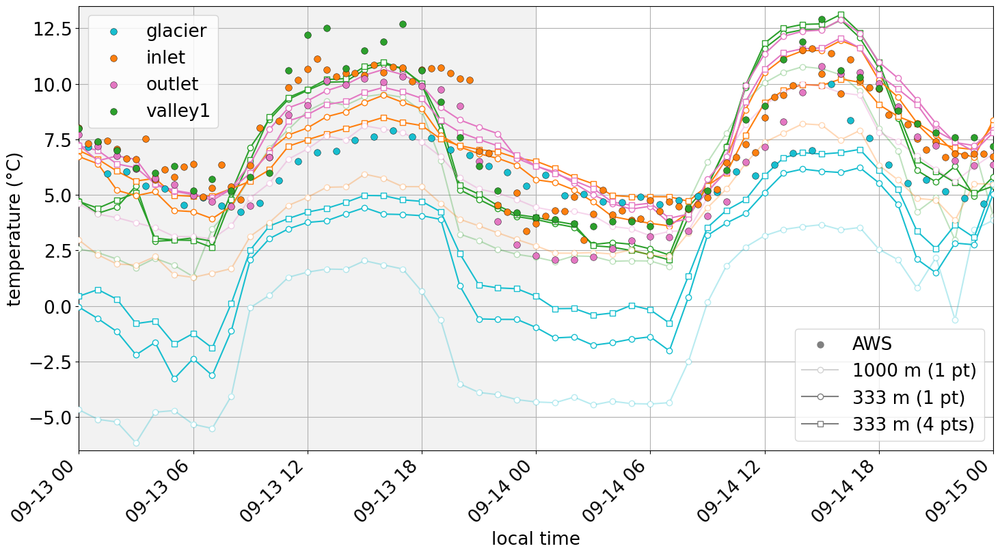

In [28]:
plotTemperatureEvolution()

In [82]:
with open('plotData.py') as f:
    exec(f.read())

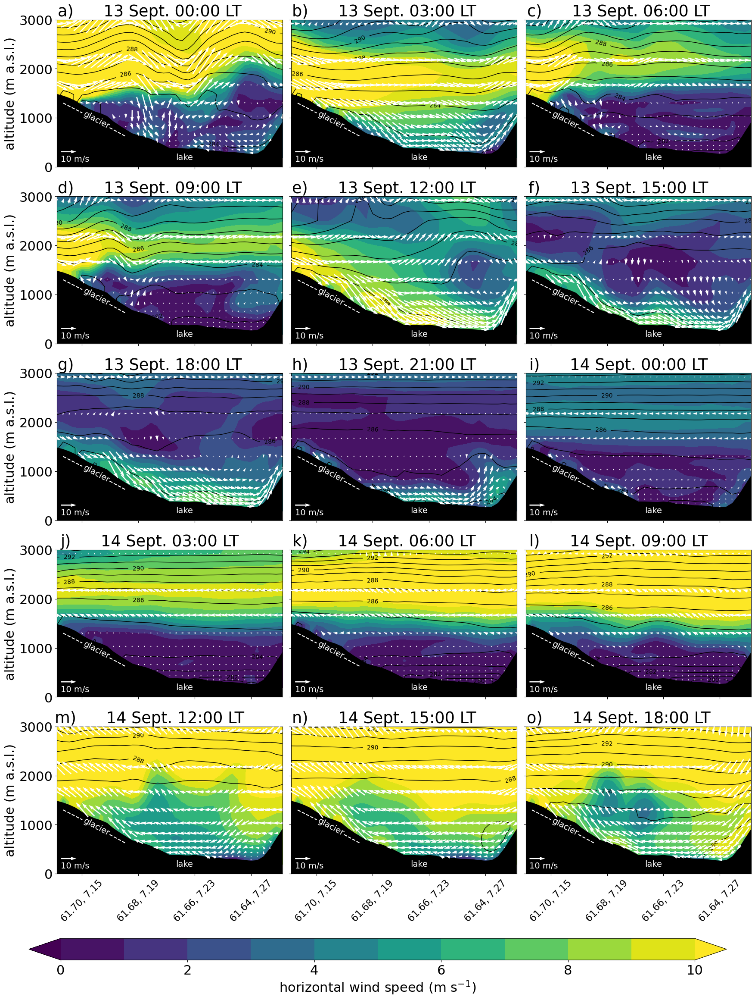

In [83]:
plotWindCrossSection(var='ws')

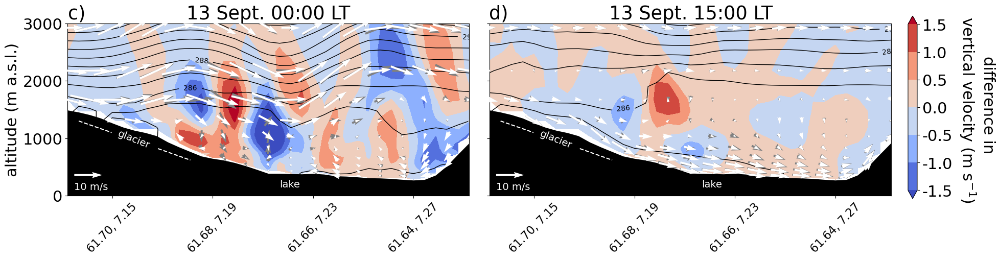

In [80]:
plotLakeTempSensitivity(var='w')

<string>:2754: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


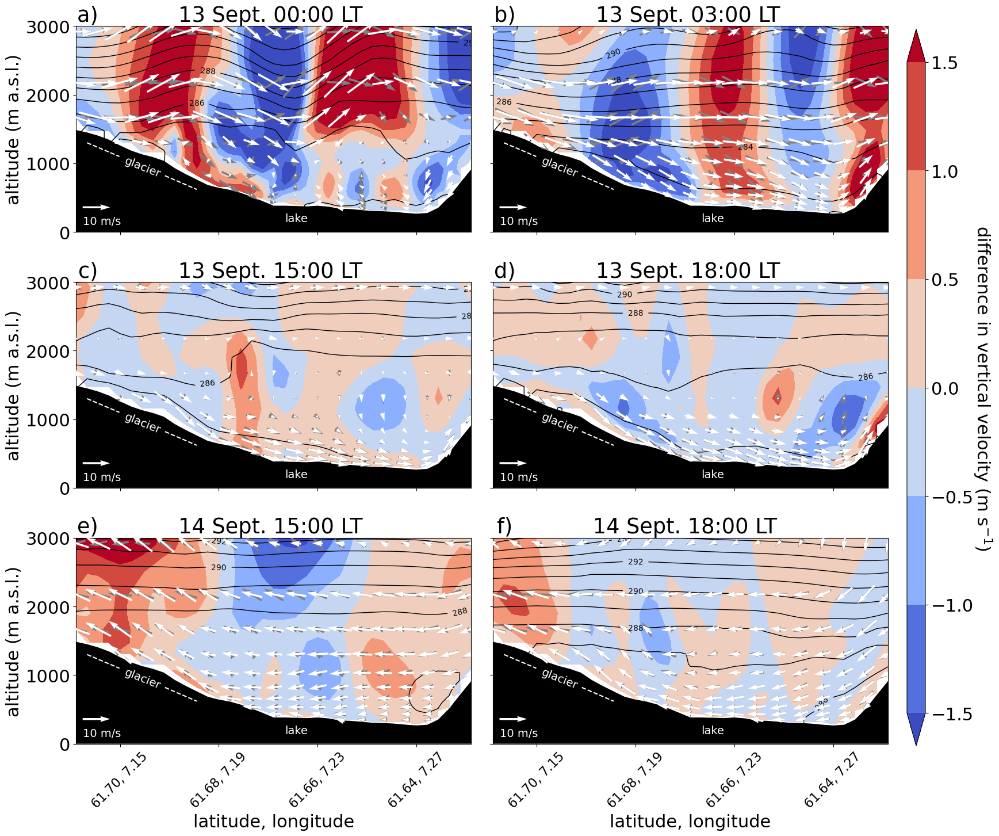

In [85]:
plotGlacierSensitivity(var='w')

In [7]:
def read_cross_section_geoloc(wrf_file, cross_start, cross_end):

    # print(cross_start,cross_end)
    # print(ys)

    lu_line = interpline(lu, wrfin=wrf_file,
                         start_point=cross_start, end_point=cross_end)
    ter_line = interpline(ter, wrfin=wrf_file,
                          start_point=cross_start, end_point=cross_end)
    glacier_idx = (np.where(lu_line < 24))
    hgt_glacier = ter_line.copy()
    hgt_glacier[glacier_idx] = 'NaN'
    lake_idx = (np.where(lu_line != 16))
    hgt_lake = ter_line.copy()
    hgt_lake[lake_idx] = 'NaN'
    ter_line = interpline(ter, wrfin=wrf_file,
                          start_point=cross_start, end_point=cross_end) # why repetition?
    phbl_line = interpline(pblh, wrfin=wrf_file,
                           start_point=cross_start, end_point=cross_end)

    levels = to_np(ht)
    #levels = levels[0:30, termin[0], termin[1]] # 30 lowest levels from grid point with lowest terrain
    if file_dom == 'wrfout_d04_':
        levels = levels[0:30, 12, 81] # grid point in Jostedalen domain with low terrain height (below 200 m)
        #print (levels)
    else:
        levels = levels[0:30, 31, 58] # grid point in Fjærland domain with low terrain height
    #levels = np.append([0],levels) # to ensure interpolation start at mean sea level
    T = getvar(wrf_file, 'T')
    th_cross = vertcross(T, ht, wrfin=wrf_file, levels=levels, start_point=cross_start,
                         end_point=cross_end, latlon=True, meta=True)
    ys = to_np(th_cross.coords["vertical"])
    #lats, lons = latlon_coords(T)

    #cart_proj = get_cartopy(T)
    cpairs = to_np(th_cross.coords["xy_loc"])
    return(ys, ter_line, hgt_glacier, levels, cpairs, phbl_line, hgt_lake)


def read_cross_section(path1, var, cross_start, cross_end, ind=0):

    #termin = (np.squeeze(np.where(ter == ter_line.min())))
    levels = to_np(ht)
    if file_dom == 'wrfout_d04_':
        levels = levels[0:30, 12, 81] # grid point in Jostedalen domain with low terrain height (below 200 m)
    else:
        levels = levels[0:30, 30, 57]#1, 49]#termin[0], termin[1]]
    #levels = np.append([0],levels)
    
    files = nc.Dataset(path1, 'r')
    if var == 'uvmet':
        variable = getvar(files,'uvmet')[ind] #files.variables[var][0, :, :, :][ind]
#        print ('ind ',ind)
    elif var == 'z':
        variable = getvar(files,'z')
        #var2 = getvar(files,'T')
        #variable = brunt_vaisala_frequency_squared(var1,var2+300*units.kelvin)
    else:
        variable = files.variables[var][0, :, :, :]
    
    # defining staggered grid for vertical cross section
    if var == 'T':
        st = 'm'
    elif var == 'U':
        st = 'u'
    elif var == 'V':
        st = 'v'
        
    #nx = np.shape(u)[0] - 1 
    #ny = np.shape(v)[1] - 1 
    #nz = np.shape(u)[2] 
    #u_center = 0.5 * (u[0:nx,:,:] + u[1:nx+1,:,:]) 
    #v_center = 0.5 * (v[:,0:ny,:] + v[:,1:ny+1,:])
    if var == 'W': ##################### also move u,v to center of grid?
#        print ('calculating mass weighted vertical velocity')
        variable = 0.5 * (variable[0:59,:,:] + variable[1:60,:,:])
    
#    print ('shape: ', np.shape(variable), np.shape(ht))
    
    th_cross = vertcross(variable, ht, wrfin=wrf_file, levels=levels, 
                         #stagger='m', ##################
                         start_point=cross_start, end_point=cross_end, 
                         latlon=True, meta=True)
    dbz_cross_filled = np.ma.copy(to_np(th_cross))
    
#    print ('LOKHERE', th_cross[sin:ein,0:2])
    # going through each column and redefining all nonreal values (='--')
    # to the lowest real value (> -200)
    if var != 'W': #var != 'U' and var != 'V' and 
#        print (f'filling values below lowest model level for variable {var}')
        for i in range(dbz_cross_filled.shape[-1]):
            column_vals = dbz_cross_filled[:, i]
            first_idx = int(np.transpose(
                (column_vals > -200).nonzero())[0])
            dbz_cross_filled[0:first_idx, i] = th_cross[first_idx, i]
            th_cross_filled = dbz_cross_filled
    else:
        th_cross_filled = th_cross
    xs = np.arange(0, th_cross.shape[-1], 1)
    return(xs, th_cross_filled)
    #ys = to_np(th_cross.coords["vertical"])

In [31]:
wrf_str = []
date_for_file = pd.to_datetime("2023-09-12 22:00:00")
for i in range(15):
    wrf_str.append('wrfout_d04_'+str(date_for_file)[:10]+'_'+str(date_for_file)[11:])
    date_for_file = date_for_file + pd.Timedelta(hours=3)

['wrfout_d04_2023-09-12_22:00:00',
 'wrfout_d04_2023-09-13_01:00:00',
 'wrfout_d04_2023-09-13_04:00:00',
 'wrfout_d04_2023-09-13_07:00:00',
 'wrfout_d04_2023-09-13_10:00:00',
 'wrfout_d04_2023-09-13_13:00:00',
 'wrfout_d04_2023-09-13_16:00:00',
 'wrfout_d04_2023-09-13_19:00:00',
 'wrfout_d04_2023-09-13_22:00:00',
 'wrfout_d04_2023-09-14_01:00:00',
 'wrfout_d04_2023-09-14_04:00:00',
 'wrfout_d04_2023-09-14_07:00:00',
 'wrfout_d04_2023-09-14_10:00:00',
 'wrfout_d04_2023-09-14_13:00:00',
 'wrfout_d04_2023-09-14_16:00:00']

In [32]:
wrf_file = Dataset('data/wrf_files/wrfout_d04_3D_warm-lake.nc')

In [33]:
ter = getvar(wrf_file, "ter", timeidx=-1)
lon = getvar(wrf_file, 'lon', timeidx=-1)
lat = getvar(wrf_file, 'lat', timeidx=-1)
lu = wrf_file.variables['LU_INDEX'][0, :, :]
lats, lons = latlon_coords(ter)

ph = wrf_file.variables['PH'][0, :, :, :]#[0, :-1, :, :] # removing last vertical grid to match staggered values like T, u, v, w (means data is shifted half a vertical grid point)
phb = wrf_file.variables['PHB'][0, :, :, :]#[0, :-1, :, :]
ht = (ph+phb)/9.81

# moving staggered ht to center of grid
ht = 0.5 * (ht[0:-1,:,:] + ht[1:,:,:])

levels = to_np(ht)

NameError: name 'getvar' is not defined

In [ ]:
from metpy.calc import brunt_vaisala_frequency_squared, second_derivative

In [234]:
#from wrf import (getvar, interplevel, to_np, latlon_coords, get_cartopy,
#                 cartopy_xlim, cartopy_ylim, vertcross, interpline, 
#                 CoordPair, xy, interp2dxy)

In [237]:
MG.iloc[50:100]

,date,PREC,T,Relativ luftfuktighet,hour,PREC_day
50,2023-09-12 04:00:00,0.0,8.7,97.0,4,NaN
51,2023-09-12 05:00:00,0.0,8.9,97.0,5,NaN
52,2023-09-12 06:00:00,0.0,8.2,98.0,6,43.1
53,2023-09-12 07:00:00,0.0,8.4,98.0,7,NaN
54,2023-09-12 08:00:00,0.0,8.7,98.0,8,NaN
55,2023-09-12 09:00:00,0.3,9.1,98.0,9,NaN
56,2023-09-12 10:00:00,0.1,9.8,96.0,10,NaN
57,2023-09-12 11:00:00,0.2,9.8,93.0,11,NaN
58,2023-09-12 12:00:00,0.0,10.7,87.0,12,NaN
59,2023-09-12 13:00:00,0.0,12.2,76.0,13,NaN


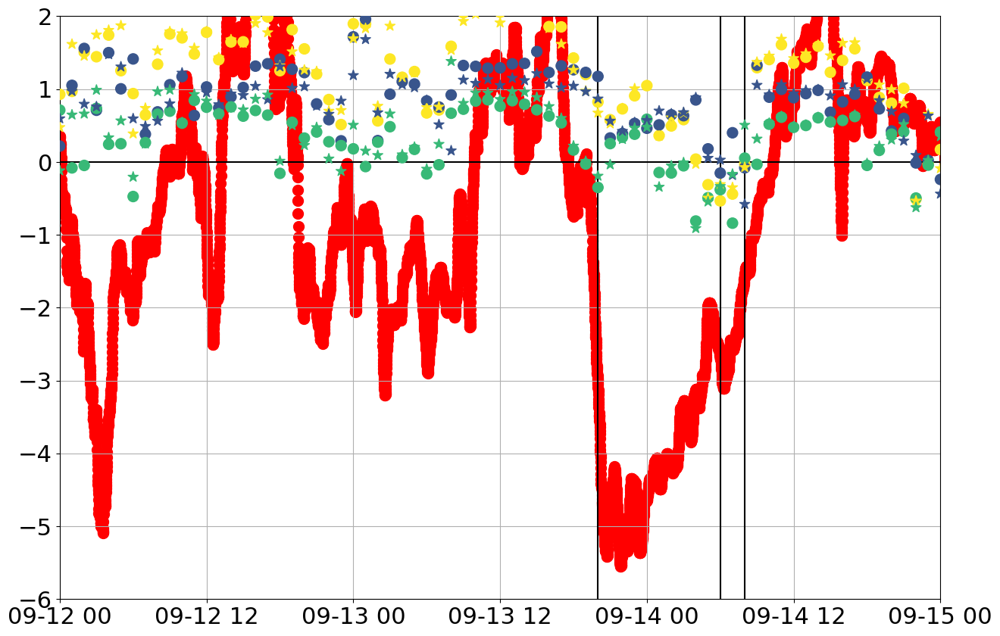

In [48]:
fig,ax = plt.subplots(figsize=(15,10))
dates = np.load(f'wrf_profiles-and-timeseries/surface_temp/dates-for-T2.npy')
markers = ['o','*']
for fl,tl in enumerate(['warm','cold']):
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)
#    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_inlet.npy')[:,0], 
#               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(829), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(703), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0]-np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(2700), marker=markers[fl], s=100, zorder=10000)
#    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0], 
#               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)

    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_forefield.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(703), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_inlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(829), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_outlet.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(2700), marker=markers[fl], s=100, zorder=10000)
    ax.scatter(dates[:,0], np.load(f'wrf_profiles-and-timeseries/surface_temp/T2_{tl}lake_valley-TT.npy')[:,0], 
               vmin=vmin,vmax=vmax, c=np.ones(np.shape(dates[:,0]))*(4290), marker=markers[fl], s=100, zorder=10000)

ax.scatter(ttFF['date_FF1'], ttFF['t_FF1']-ttFF['t_FF9'], c='r', s=100, zorder=-10)

ax.axhline(0,c='k')
ax.axvline(datetime(2023,9,13,20,0,0),c='k')
ax.axvline(datetime(2023,9,14,6,0,0),c='k')
ax.axvline(datetime(2023,9,14,8,0,0),c='k')

ax.set_xlim(datetime(2023,9,12,0,0,0),datetime(2023,9,15,0,0,0))
ax.set_ylim(-6,2)
ax.grid(True)

In [49]:
# vertical profiles of temperature

path = 'UAV/iMet/'
extension = 'csv'

fns = glob.glob(path+'*.{}'.format(extension))
imets = {}

profiles = ['5','5-US','7','7-US','10','10-US','13','13-US','16']
profiles = profiles[:]#['11']#

outlet = False
inlet = True#False

for ph in profiles:
    for fn in fns:
        print (fn[len(path)+6:len(path)+8],fn[len(path)+25:len(path)+33])
        if (fn[len(path)+6:len(path)+8] == '13') or (fn[len(path)+6:len(path)+8] == '14'):# and (fn[-14:] != 'paraglider.csv'):
            imet = pd.read_csv(fn, sep=',', dtype='string', usecols=['XQ-iMet-XQ Pressure','XQ-iMet-XQ Air Temperature','XQ-iMet-XQ Humidity', 'XQ-iMet-XQ Date', 'XQ-iMet-XQ Time','XQ-iMet-XQ Longitude', 'XQ-iMet-XQ Latitude', 'XQ-iMet-XQ Altitude', 'Profile hour'])
            if imet.empty:
                print(f'DataFrame is empty!')
            else:
                imet = imet.rename(columns={'XQ-iMet-XQ Pressure': 'p', 'XQ-iMet-XQ Air Temperature': 't', 'XQ-iMet-XQ Humidity': 'rh', 'XQ-iMet-XQ Date': 'Date', 'XQ-iMet-XQ Time': 'time', 'XQ-iMet-XQ Longitude': 'lon', 'XQ-iMet-XQ Latitude': 'lat', 'XQ-iMet-XQ Altitude': 'z', 'Profile hour': 'hour'})
                imet = (imet.astype({col: float for col in imet.columns[:3]}))
                imet = (imet.astype({col: float for col in imet.columns[5:8]}))
                imet['pt'] = (imet['t']+273.15)*(1013/imet['p'])**(0.286)
                if fn[-14:] == 'paraglider.csv' or (fn[len(path)+6:len(path)+8] == '12' and fn[-9:] == 'front.csv'):
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%d/%m/%Y %H:%M:%S')
                else:
                    imet['date'] = pd.to_datetime(imet['Date']+' '+imet['time'], format='%Y/%m/%d %H:%M:%S')
                del imet['Date'], imet['time']

                if fn[len(path)+25:len(path)+28] != 'gla':
                    imet_tmp = imet.loc[(imet['hour'])==ph]
                    if imet_tmp.empty != True:
                        if fn[-14:] != 'paraglider.csv':
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]] = imet_tmp.reset_index(drop=True)
                        else:
                            print ('using paraglider data')
                            imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'aglider'] = imet_tmp.reset_index(drop=True)
                else:
                    imet_tmp = imet.loc[imet['hour']==ph+'-UP']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-upper'] = imet_tmp.reset_index(drop=True)
                    imet_tmp = imet.loc[imet['hour']==ph+'-LOW']
                    if imet_tmp.empty != True:
                        imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-lower'] = imet_tmp.reset_index(drop=True)
                    #imet_tmp = imet.loc[imet['hour']==ph+'-extra']
                    #if imet_tmp.empty != True:
                    #    imets[fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+28]+'-extra'] = imet_tmp.reset_index(drop=True)
                if imet_tmp.empty:
                    print (fn[len(path)+6:len(path)+8]+'-'+ph+'-'+fn[len(path)+25:len(path)+35])
                elif fn[len(path)+25:len(path)+28] == 'out':
                    #print (fn, imet_tmp)
                    outlet = True
                elif fn[len(path)+25:len(path)+28] == 'in':
                    inlet = True

13 paraglid
13-5-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-inlet.csv
13 outlet.c
13 glacier.
14 glacier.
14 front.cs
13 paraglid
13-5-US-paraglider
13 front.cs
13-5-US-front.csv
20 65717_gl
14 inlet.cs
14-5-US-inlet.csv
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-5-US-inlet.csv
13 outlet.c
13-5-US-outlet.csv
13 glacier.
13-5-US-glacier.cs
14 glacier.
14-5-US-glacier.cs
14 front.cs
13 paraglid
13-7-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13 outlet.c
13 glacier.
14 glacier.
14 front.cs
13 paraglid
13-7-US-paraglider
13 front.cs
13-7-US-front.csv
20 65717_gl
14 inlet.cs
12 glacier.
12 front.cs
12 inlet.cs
12 outlet.c
13 inlet.cs
13-7-US-inlet.csv
13 outlet.c
13-7-US-outlet.csv
13 glacier.
13-7-US-glacier.cs
14 glacier.
14-7-US-glacier.cs
14 front.cs
13 paraglid
13-10-paraglider
13 front.cs
20 65717_gl
14 inlet.cs
12 glacier.
12 front.c

In [13]:
imets.keys()

dict_keys([])

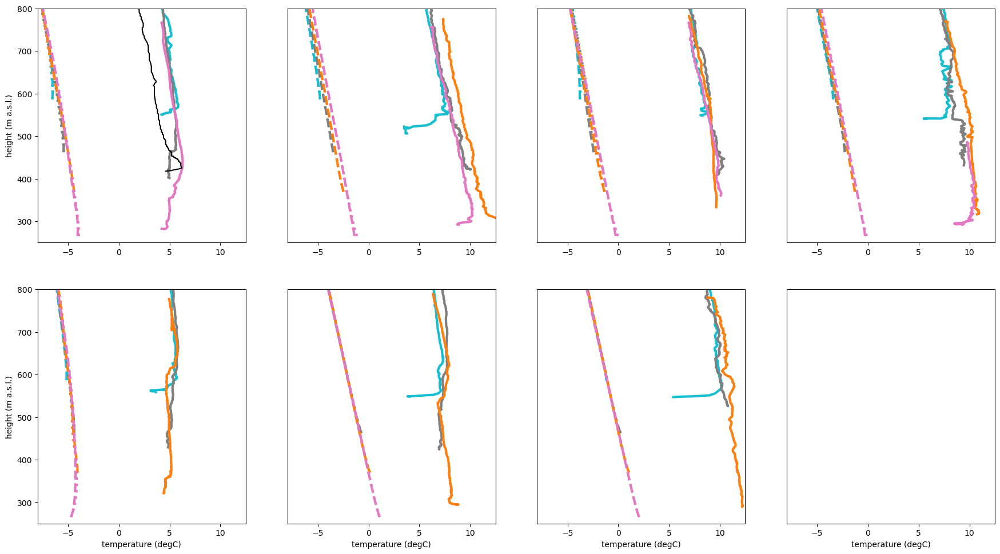

In [62]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(24*.9,13*.9))

colours = [c[9],c[7],c[1],c[6]]
for i,h in enumerate(['05','10','13','16']):#'07','12','15','18']):
    for j,loc in enumerate(['glacier', 'front', 'inlet', 'outlet']):
        height = np.load(f'wrf_profiles-and-timeseries/1pt-profiles/height_{loc}.npy')-100
        axes[0,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_coldlake_{loc}_13-{h}.npy'), height, lw=3, ls='--', c=colours[j])
        axes[0,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_warmlake_{loc}_13-{h}.npy'), height, lw=3, ls=':', c=colours[j])
        if h != '16':
            axes[1,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_coldlake_{loc}_14-{h}.npy'), height, lw=3, ls='--', c=colours[j])
            axes[1,i].plot(np.load(f'wrf_profiles-and-timeseries/1pt-profiles/T_warmlake_{loc}_14-{h}.npy'), height, lw=3, ls=':', c=colours[j])

        if loc == 'glacier':
            axes[0,i].plot(imets[f'13-{int(h)}-gla-lower']['t'],imets[f'13-{int(h)}-gla-lower']['z'], lw=3, c=colours[j])
            if h != '16':
                axes[1,i].plot(imets[f'14-{int(h)}-gla-lower']['t'],imets[f'14-{int(h)}-gla-lower']['z'], lw=3, c=colours[j])
        else:
            if (loc != 'inlet'):
                axes[0,i].plot(imets[f'13-{int(h)}-{loc[:3]}']['t'],imets[f'13-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])
            elif loc == 'inlet' and h != '05':
                axes[0,i].plot(imets[f'13-{int(h)}-{loc[:3]}']['t'],imets[f'13-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])
            if (h != '16') and (loc != 'outlet'):
                axes[1,i].plot(imets[f'14-{int(h)}-{loc[:3]}']['t'],imets[f'14-{int(h)}-{loc[:3]}']['z'], lw=3, c=colours[j])

axes[0,0].plot(RS4['t'], RS4['z'], c='k')

for i in range(2):
    for j in range(4):
        axes[i,j].set_xlim(-8,12.5)
        axes[i,j].set_ylim(250,800)
        if j != 0:
            axes[i,j].set_yticks([])
        axes[1,j].set_xlabel('temperature (degC)')
    axes[i,0].set_ylabel('height (m a.s.l.)')
    